In [1]:
# import kagglehub
# import shutil
# import os

# sayedgamal99_smoke_fire_detection_yolo_path = kagglehub.dataset_download('sayedgamal99/smoke-fire-detection-yolo')
# destination_folder = "D:/t/SmokeFire"

# os.makedirs(destination_folder, exist_ok=True)
# shutil.copytree(sayedgamal99_smoke_fire_detection_yolo_path, destination_folder, dirs_exist_ok=True)

# print(f"Датасет успешно сохранён в: {destination_folder}")

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>🗂️1. Install libraries and Download a pre-trained checkpoint 🗂️</b></font>
</div>

In [3]:
# !pip install ultralytics
from ultralytics import YOLO
model = YOLO("yolo11m.pt")

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>📈 2. Data Analysis 📈</b></font>
</div>

Data analysis is in process...

Data analysis is in process...

Data analysis is in process...



C:\Users\User\AppData\Local\Temp\ipykernel_12432\1663057559.py:110: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)
C:\Users\User\AppData\Local\Temp\ipykernel_12432\1663057559.py:110: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)
C:\Users\User\AppData\Local\Temp\ipykernel_12432\1663057559.py:110: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(cls_names)


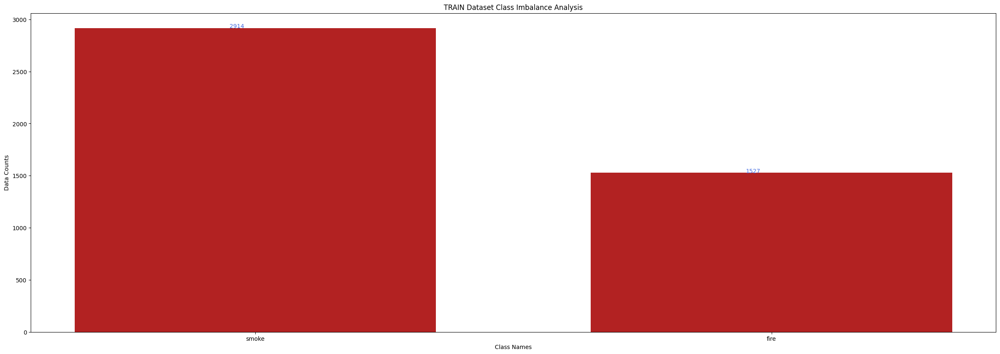

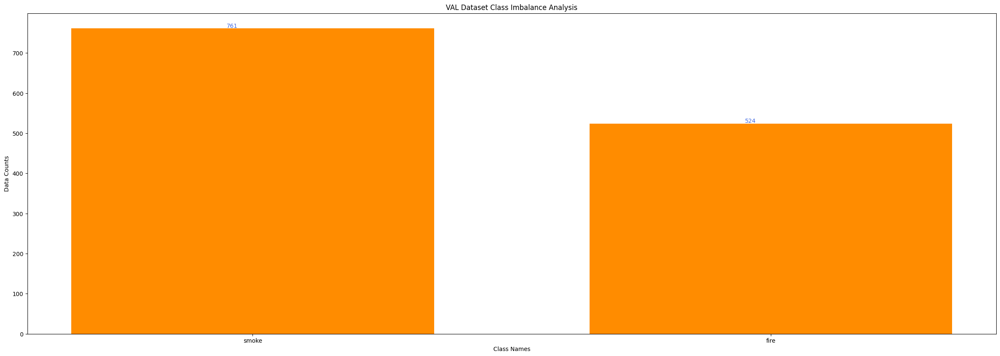

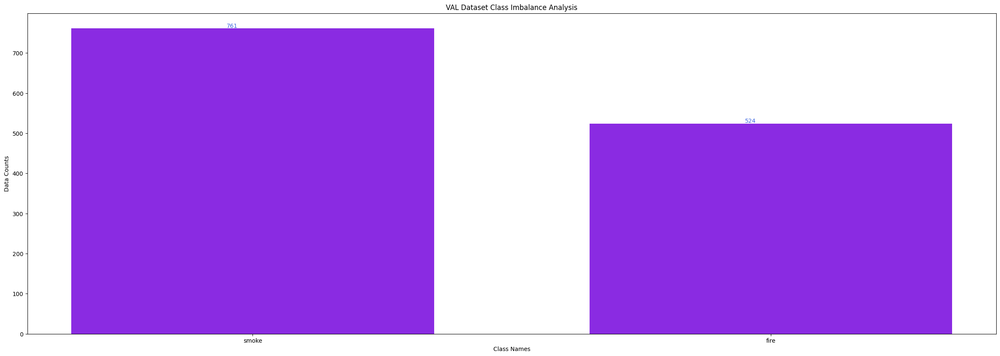

In [4]:
import os, cv2, yaml, random, numpy as np
from PIL import Image
from glob import glob
from matplotlib import pyplot as plt
from torchvision import transforms as T

class Visualization:

    def __init__(self, root, data_types, n_ims, rows, cmap = None):

        self.n_ims, self.rows = n_ims, rows
        self.cmap, self.data_types  = cmap, data_types
        self.colors = ["firebrick", "darkorange", "blueviolet"]

        self.get_cls_names(); self.get_bboxes()

    def get_cls_names(self):

        with open(f"{root}/data.yaml", 'r') as file: data = yaml.safe_load(file)
        # Extract class names
        class_names = data['names']

        # Create a dictionary with index as key and class name as value
        self.class_dict = {index: name for index, name in enumerate(class_names)}

    def get_bboxes(self):

        self.vis_datas, self.analysis_datas, self.im_paths = {}, {}, {}
        for data_type in self.data_types:
            all_bboxes, all_analysis_datas = [], {}
            im_paths = glob(f"{root}/data/{data_type}/images/*")

            for idx, im_path in enumerate(im_paths):
                # if idx == 3: break
                bboxes = []
                im_ext = os.path.splitext(im_path)[-1]
                lbl_path = im_path.replace(im_ext, ".txt")
                lbl_path  = lbl_path.replace(f"{data_type}/images", f"{data_type}/labels")
                if not os.path.isfile(lbl_path): continue
                meta_data = open(lbl_path).readlines()
                for data in meta_data:
                    # Split the string by space and strip the newline character
                    # Change here
                    parts = data.strip().split()[:5]
                    cls_name = self.class_dict[int(parts[0])]
                    # Convert first element to integer and the rest to float
                    bboxes.append([cls_name] + [float(x) for x in parts[1:]])
                    if cls_name not in all_analysis_datas: all_analysis_datas[cls_name] = 1
                    else: all_analysis_datas[cls_name] += 1
                all_bboxes.append(bboxes)

            self.vis_datas[data_type] = all_bboxes; self.analysis_datas[data_type] = all_analysis_datas; self.im_paths[data_type] = im_paths

    def plot(self, rows, cols, count, im_path, bboxes):

        plt.subplot(rows, cols, count)
        or_im = np.array(Image.open(im_path).convert("RGB"))
        height, width, _ = or_im.shape

        for bbox in bboxes:

            class_id, x_center, y_center, w, h = bbox

            # Convert YOLO format to pixel values
            x_min = int((x_center - w / 2) * width)  # x_min
            y_min = int((y_center - h / 2) * height)  # y_min
            x_max = int((x_center + w / 2) * width)  # x_max
            y_max = int((y_center + h / 2) * height)  # y_max

            color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
            cv2.rectangle(img = or_im, pt1 = (x_min, y_min), pt2 = (x_max, y_max), color = color, thickness = 3)
        plt.imshow(or_im)
        plt.axis("off"); plt.title(f"There is (are) {len(bboxes)} object(s) in the image.")

        return count + 1

    def vis(self, save_name):

        print(f"{save_name.upper()} Data Visualization is in process...\n")
        assert self.cmap in ["rgb", "gray"], "Please choose rgb or gray cmap"
        if self.cmap == "rgb": cmap = "viridis"
        cols = self.n_ims // self.rows; count = 1

        plt.figure(figsize = (25, 20))

        indices = [random.randint(a = 0, b = len(self.vis_datas[save_name]) - 1) for _ in range(self.n_ims)]

        for idx, index in enumerate(indices):

            if count == self.n_ims + 1: break

            im_path, bboxes = self.im_paths[save_name][index], self.vis_datas[save_name][index]

            count = self.plot(self.rows, cols, count, im_path = im_path, bboxes = bboxes)

        plt.show()

    def data_analysis(self, save_name, color):

        print("Data analysis is in process...\n")

        width, text_width, text_height = 0.7, 0.05, 2
        cls_names = list(self.analysis_datas[save_name].keys()); counts = list(self.analysis_datas[save_name].values())

        _, ax = plt.subplots(figsize = (30, 10))
        indices = np.arange(len(counts))

        ax.bar(indices, counts, width, color = color)
        ax.set_xlabel("Class Names", color = "black")
        ax.set_xticklabels(cls_names)
        ax.set(xticks = indices, xticklabels = cls_names)
        ax.set_ylabel("Data Counts", color = "black")
        ax.set_title(f"{save_name.upper()} Dataset Class Imbalance Analysis")

        for i, v in enumerate(counts): ax.text(i - text_width, v + text_height, str(v), color = "royalblue")

    def visualization(self): [self.vis(save_name) for save_name in self.data_types]

    def analysis(self): [self.data_analysis(save_name, color) for (save_name, color) in zip(self.data_types, self.colors)]

# root = "/kaggle/input/smoke-fire-detection-yolo"
root =  r"D:\t\dataset_fire_smoke"  #D:/t/SmokeFire"
vis = Visualization(root = root, data_types = ["train", "val", "val"], n_ims = 20, rows = 5, cmap = "rgb")
vis.analysis()

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>📊 3. Data Visualization 📊</b></font>
</div>

TRAIN Data Visualization is in process...



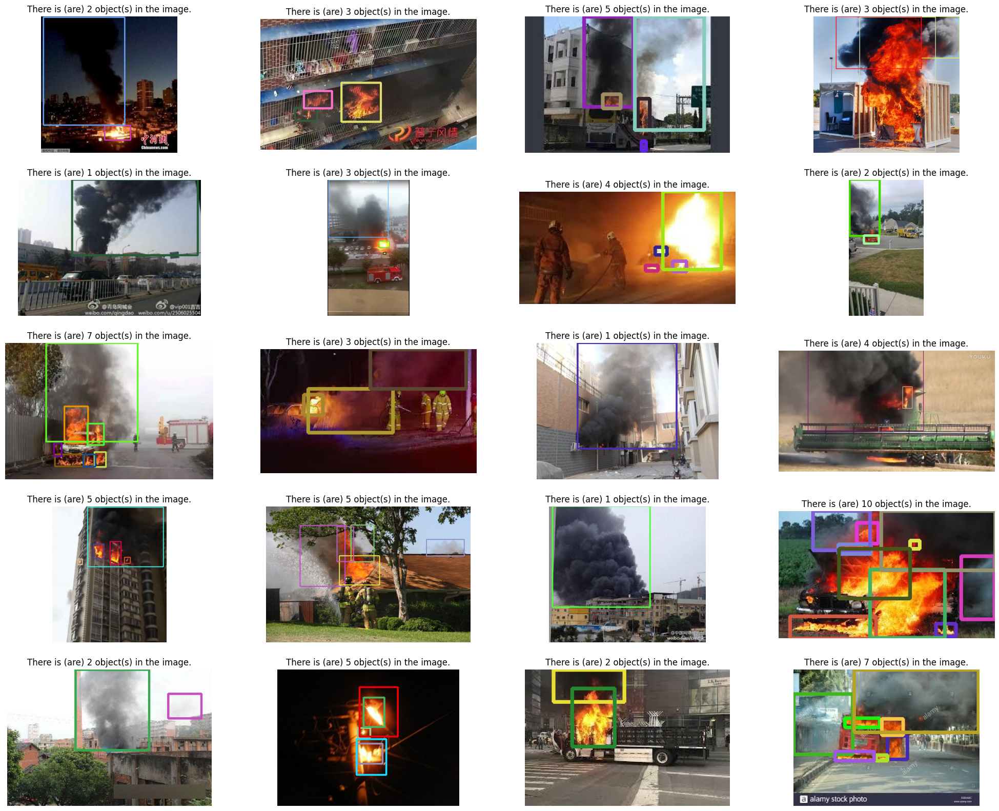

VAL Data Visualization is in process...



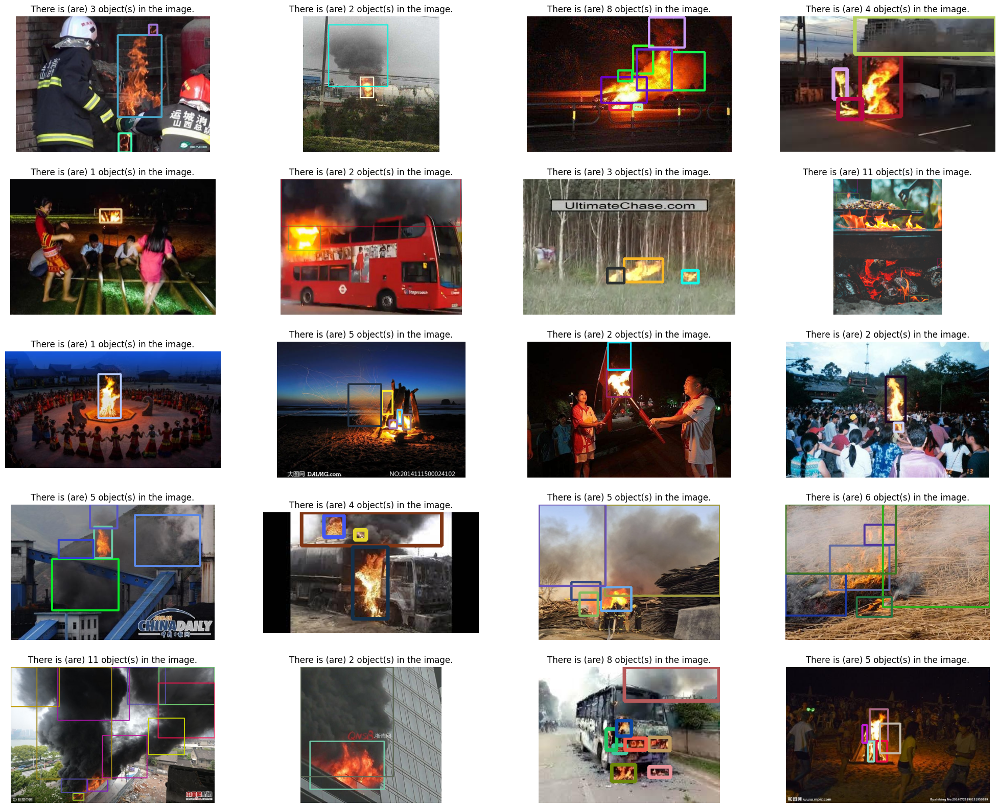

VAL Data Visualization is in process...



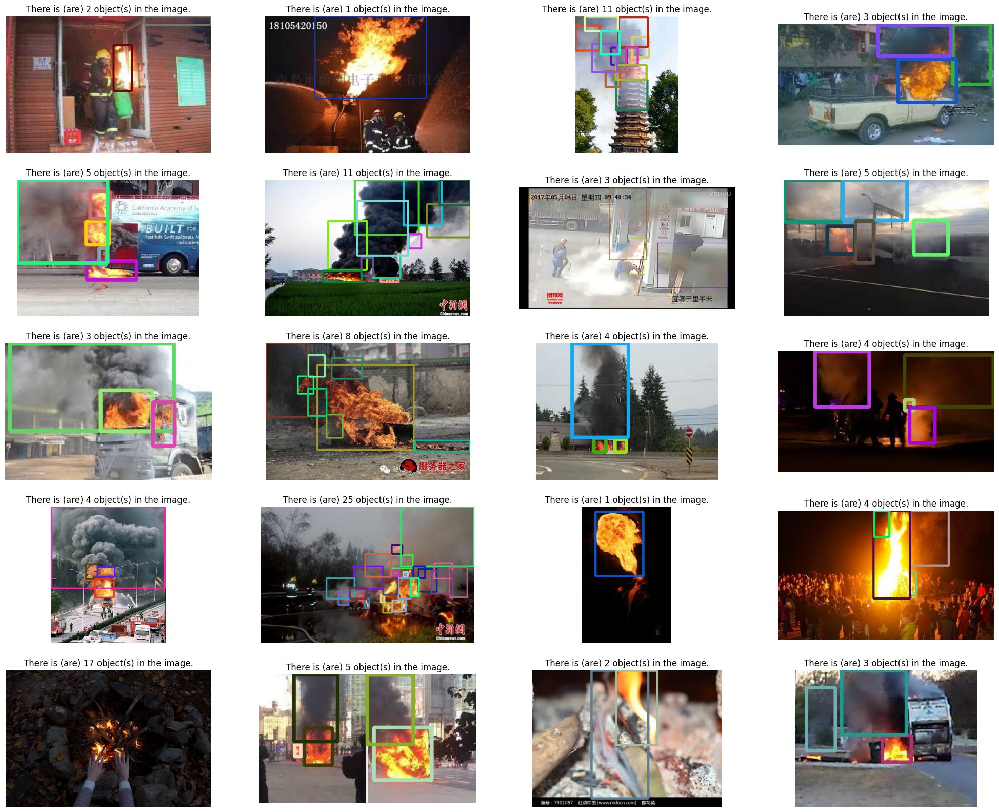

In [5]:
vis.visualization()

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>✨ 4. AI Model Train✨</b></font>
</div>

In [6]:
# Load YAML content into a Python dictionary
# yml_file_path = f"{root}/data.yaml"
# yml_file_path = "D:/t/SmokeFire/data.yaml" 
yml_file_path = r"D:\t\dataset_fire_smoke\data.yaml" 

with open(yml_file_path, 'r') as file: data = yaml.safe_load(file)

# Update the paths
data['train'] = f'{root}/data/train'
data['val']   = f'{root}/data/val'
data['test']  = f'{root}/data/val'

print(data)


{'path': '/dataset_fire_smoke/', 'train': 'D:\\t\\dataset_fire_smoke/data/train', 'val': 'D:\\t\\dataset_fire_smoke/data/val', 'test': 'D:\\t\\dataset_fire_smoke/data/val', 'names': ['smoke', 'fire'], 'nc': 2}


In [7]:
# # Save the updated YAML content to a file
output_path = r'D:\t\updated_config.yml'
with open(output_path, 'w') as file: yaml.dump(data, file, default_flow_style=False)

In [8]:
train_results = model.train(
    data=output_path,
    epochs=100,  # number of training epochs
    imgsz=640,  # training image size
    workers=0,  # number of workers for data loadingbat
    half=True,  # use half precision (FP16) for training
    dropout=0.2,  # dropout rate
    batch=8,  # batch size
    device=[0]
    ) 

New https://pypi.org/project/ultralytics/8.3.105 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.82  Python-3.10.6 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 2060 SUPER, 8192MiB)
engine\trainer: task=detect, mode=train, model=yolo11m.pt, data=D:\t\updated_config.yml, epochs=100, time=None, patience=100, batch=8, imgsz=640, save=True, save_period=-1, cache=False, device=[0], workers=0, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.2, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=True, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False,

train: Scanning D:\t\dataset_fire_smoke\data\train\labels.cache... 1142 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1142/1142 [00:00<?, ?it/s]
val: Scanning D:\t\dataset_fire_smoke\data\val\labels.cache... 308 images, 0 backgrounds, 0 corrupt: 100%|██████████| 308/308 [00:00<?, ?it/s]


Plotting labels to runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 0 dataloader workers
Logging results to runs\detect\train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      4.29G      1.825      2.231      1.745         46        640: 100%|██████████| 143/143 [00:56<00:00,  2.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:10<00:00,  1.86it/s]

                   all        308       1285        0.1      0.305     0.0637     0.0237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      4.35G      1.966      2.189      1.859         47        640: 100%|██████████| 143/143 [01:05<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.09it/s]

                   all        308       1285       0.16      0.268      0.108     0.0399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      4.27G      1.979      2.234      1.876         59        640: 100%|██████████| 143/143 [01:05<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:10<00:00,  1.85it/s]


                   all        308       1285      0.243      0.247      0.151     0.0539

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      4.27G       1.97      2.156       1.84         38        640: 100%|██████████| 143/143 [00:55<00:00,  2.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.29it/s]

                   all        308       1285      0.346      0.314      0.238     0.0947



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      4.34G      1.867      2.075      1.783         36        640: 100%|██████████| 143/143 [00:59<00:00,  2.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.05it/s]

                   all        308       1285      0.367      0.297      0.238     0.0925



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      4.31G       1.84       2.01      1.753         44        640: 100%|██████████| 143/143 [01:05<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.367      0.275      0.226     0.0946



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      4.29G      1.833      1.997      1.756         20        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.402      0.314      0.288      0.132



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      4.32G       1.78       1.93      1.719         61        640: 100%|██████████| 143/143 [01:02<00:00,  2.28it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.02it/s]

                   all        308       1285      0.472      0.359      0.327      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      4.32G      1.756      1.902      1.698         26        640: 100%|██████████| 143/143 [01:06<00:00,  2.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.03it/s]

                   all        308       1285      0.394      0.309      0.283      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      4.31G      1.757       1.89      1.703         36        640: 100%|██████████| 143/143 [01:00<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.02it/s]

                   all        308       1285      0.408      0.325      0.295      0.129



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      4.31G      1.739      1.858      1.672         56        640: 100%|██████████| 143/143 [01:05<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.03it/s]

                   all        308       1285       0.46      0.334      0.334      0.144



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      4.27G      1.718       1.81      1.665         38        640: 100%|██████████| 143/143 [01:04<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.08it/s]

                   all        308       1285      0.439      0.283      0.267      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      4.32G      1.689      1.803       1.64         66        640: 100%|██████████| 143/143 [01:05<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.04it/s]

                   all        308       1285      0.493      0.342       0.33      0.143



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      4.31G      1.691      1.786      1.653         47        640: 100%|██████████| 143/143 [01:03<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.06it/s]

                   all        308       1285      0.515      0.336      0.344      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      4.31G      1.676      1.754      1.637         40        640: 100%|██████████| 143/143 [01:04<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.08it/s]

                   all        308       1285       0.53      0.367      0.379      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      4.32G      1.675      1.775      1.626         49        640: 100%|██████████| 143/143 [01:04<00:00,  2.21it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.03it/s]


                   all        308       1285       0.51      0.377      0.376      0.176

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      4.32G      1.645      1.743      1.611         40        640: 100%|██████████| 143/143 [01:05<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:10<00:00,  1.98it/s]

                   all        308       1285      0.517      0.376      0.383      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      4.32G      1.633      1.717      1.607         35        640: 100%|██████████| 143/143 [01:05<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.01it/s]


                   all        308       1285      0.572      0.353      0.364      0.172

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      4.31G      1.612      1.665      1.585         47        640: 100%|██████████| 143/143 [01:05<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.04it/s]

                   all        308       1285      0.548      0.367      0.395      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      4.28G      1.633      1.658      1.601         46        640: 100%|██████████| 143/143 [01:05<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.07it/s]

                   all        308       1285      0.548      0.334      0.362      0.171



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      4.31G      1.618      1.682      1.598         41        640: 100%|██████████| 143/143 [00:55<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.27it/s]

                   all        308       1285      0.558      0.388      0.393      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      4.29G      1.591      1.652      1.572         41        640: 100%|██████████| 143/143 [00:53<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.31it/s]

                   all        308       1285      0.573      0.369       0.39       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      4.31G      1.587      1.586      1.566         23        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.24it/s]

                   all        308       1285      0.548      0.368      0.396      0.191



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      4.32G       1.59      1.615      1.575         41        640: 100%|██████████| 143/143 [00:53<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.29it/s]

                   all        308       1285      0.554      0.355      0.378      0.188



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      4.31G      1.574      1.608      1.568         40        640: 100%|██████████| 143/143 [00:53<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.29it/s]

                   all        308       1285      0.516      0.361      0.356      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      4.31G      1.554      1.595      1.549         39        640: 100%|██████████| 143/143 [00:53<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.19it/s]

                   all        308       1285      0.551       0.37      0.396      0.193



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      4.31G      1.575      1.606       1.56         62        640: 100%|██████████| 143/143 [01:06<00:00,  2.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.03it/s]

                   all        308       1285      0.574      0.368      0.401      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      4.28G      1.564       1.57      1.554         53        640: 100%|██████████| 143/143 [01:05<00:00,  2.18it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.00it/s]

                   all        308       1285      0.602      0.383      0.412      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      4.31G      1.542      1.554      1.537         48        640: 100%|██████████| 143/143 [01:05<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.04it/s]

                   all        308       1285       0.52      0.326      0.356      0.182



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      4.34G      1.554      1.569      1.552         64        640: 100%|██████████| 143/143 [00:56<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:10<00:00,  1.95it/s]

                   all        308       1285       0.54      0.391      0.422       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      4.31G       1.53      1.547      1.535         45        640: 100%|██████████| 143/143 [01:06<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.05it/s]

                   all        308       1285      0.609      0.403      0.432      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      4.31G      1.538      1.553      1.555         40        640: 100%|██████████| 143/143 [01:06<00:00,  2.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:10<00:00,  1.98it/s]

                   all        308       1285      0.534      0.358      0.383      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      4.32G      1.533      1.529      1.531         53        640: 100%|██████████| 143/143 [01:00<00:00,  2.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.26it/s]

                   all        308       1285      0.598      0.415      0.436       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      4.32G      1.508      1.484      1.522         38        640: 100%|██████████| 143/143 [00:56<00:00,  2.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.31it/s]

                   all        308       1285      0.515      0.404      0.411      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      4.32G      1.509      1.454      1.513         32        640: 100%|██████████| 143/143 [00:53<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.20it/s]

                   all        308       1285      0.556      0.388      0.407      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      4.27G      1.505      1.469      1.507         59        640: 100%|██████████| 143/143 [00:56<00:00,  2.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.18it/s]

                   all        308       1285      0.586      0.397      0.432      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      4.32G      1.488       1.46      1.502         39        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.16it/s]

                   all        308       1285      0.586      0.371      0.412      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      4.31G       1.51      1.464      1.508         44        640: 100%|██████████| 143/143 [00:58<00:00,  2.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.05it/s]

                   all        308       1285      0.591      0.388      0.431      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      4.29G      1.506      1.443      1.504         59        640: 100%|██████████| 143/143 [01:04<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.07it/s]

                   all        308       1285      0.588      0.388      0.411      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      4.31G      1.503      1.459      1.502         44        640: 100%|██████████| 143/143 [01:04<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.04it/s]

                   all        308       1285      0.541      0.397       0.41      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      4.32G       1.49      1.457      1.501         35        640: 100%|██████████| 143/143 [01:03<00:00,  2.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.30it/s]

                   all        308       1285      0.593      0.375      0.424      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      4.31G      1.477      1.434      1.507         53        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.25it/s]

                   all        308       1285      0.579      0.352       0.41      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100       4.3G      1.466      1.424      1.485         61        640: 100%|██████████| 143/143 [01:03<00:00,  2.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.07it/s]

                   all        308       1285      0.553      0.408      0.429      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      4.27G      1.459       1.42      1.479         41        640: 100%|██████████| 143/143 [01:05<00:00,  2.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.06it/s]

                   all        308       1285      0.614      0.393      0.428      0.217



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      4.31G      1.455       1.42      1.478         63        640: 100%|██████████| 143/143 [01:04<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:10<00:00,  1.99it/s]

                   all        308       1285       0.58       0.39      0.422      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      4.32G      1.452      1.393      1.478         32        640: 100%|██████████| 143/143 [01:04<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.06it/s]

                   all        308       1285      0.546      0.409      0.426      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      4.31G      1.434      1.382      1.462         37        640: 100%|██████████| 143/143 [01:04<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.06it/s]

                   all        308       1285      0.546      0.387      0.419      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      4.32G      1.426       1.38      1.455         53        640: 100%|██████████| 143/143 [01:04<00:00,  2.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.21it/s]

                   all        308       1285       0.59      0.399      0.429      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      4.31G      1.418       1.38      1.463         51        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.27it/s]

                   all        308       1285      0.633      0.399      0.449      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      4.32G      1.449      1.384      1.474         63        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.25it/s]

                   all        308       1285       0.61      0.371      0.429      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      4.29G      1.411      1.335      1.438         40        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.26it/s]

                   all        308       1285      0.572      0.416      0.436      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      4.27G      1.426       1.36      1.455         43        640: 100%|██████████| 143/143 [00:53<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.548      0.407      0.431       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100       4.3G      1.416       1.32      1.444         33        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.547      0.417      0.432      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      4.32G      1.429      1.336      1.456         33        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.19it/s]

                   all        308       1285      0.588      0.398      0.436      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      4.31G      1.429       1.36      1.463         47        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.24it/s]

                   all        308       1285      0.612      0.366      0.416      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      4.31G      1.373      1.292      1.413         40        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.24it/s]

                   all        308       1285      0.592      0.409      0.442       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      4.31G      1.376      1.269      1.423         66        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.25it/s]

                   all        308       1285      0.558      0.394      0.427       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      4.31G      1.372      1.285      1.421         58        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.26it/s]

                   all        308       1285      0.623      0.398       0.45      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      4.32G      1.385      1.296      1.439         53        640: 100%|██████████| 143/143 [00:54<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.26it/s]

                   all        308       1285       0.62      0.386      0.436      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      4.27G      1.373      1.283       1.42         36        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.26it/s]

                   all        308       1285      0.585      0.402      0.424      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      4.34G      1.375      1.258       1.41         26        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.543      0.429      0.448      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      4.32G      1.376      1.262      1.408         73        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.26it/s]

                   all        308       1285      0.564      0.412      0.439      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      4.29G      1.347      1.256      1.409         44        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.29it/s]

                   all        308       1285      0.617       0.38      0.431      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100       4.3G      1.333      1.226      1.393         35        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.595      0.413      0.434      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      4.32G      1.334      1.219       1.39         54        640: 100%|██████████| 143/143 [00:53<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.26it/s]

                   all        308       1285      0.561      0.423       0.44      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      4.32G      1.365      1.233      1.407         57        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.27it/s]

                   all        308       1285      0.578      0.409      0.431      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      4.31G       1.32      1.207      1.389         49        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.25it/s]

                   all        308       1285      0.607       0.42      0.452      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      4.25G      1.339      1.216      1.398         67        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.588      0.411      0.447      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      4.31G      1.346      1.212      1.395         47        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.23it/s]

                   all        308       1285      0.633      0.411      0.455      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      4.31G      1.309      1.199      1.391         42        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.26it/s]

                   all        308       1285      0.639      0.394      0.439      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      4.31G      1.294      1.178      1.373         47        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.29it/s]

                   all        308       1285      0.569      0.416      0.436       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      4.32G      1.319      1.175      1.378         56        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.27it/s]

                   all        308       1285      0.592      0.405       0.44       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      4.34G       1.31      1.174      1.378         42        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.29it/s]

                   all        308       1285      0.577      0.416      0.448      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      4.32G      1.293      1.184       1.37         62        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.26it/s]

                   all        308       1285      0.572      0.414      0.438      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      4.31G       1.29       1.15      1.374         36        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.606      0.407      0.455      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      4.27G       1.28      1.153      1.364         29        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.577      0.416       0.44      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      4.31G       1.27      1.134      1.353         46        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.29it/s]

                   all        308       1285      0.613       0.41      0.455      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      4.31G      1.265      1.137      1.364         36        640: 100%|██████████| 143/143 [00:53<00:00,  2.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.24it/s]

                   all        308       1285      0.628      0.412      0.455      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      4.31G      1.259      1.107      1.336         28        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.15it/s]

                   all        308       1285      0.611      0.413      0.447      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      4.31G      1.263      1.107      1.336         37        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.569      0.426      0.446      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      4.31G      1.262        1.1      1.336         27        640: 100%|██████████| 143/143 [00:55<00:00,  2.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.03it/s]

                   all        308       1285      0.557      0.419      0.444      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      4.34G      1.225      1.096      1.331         70        640: 100%|██████████| 143/143 [01:01<00:00,  2.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.21it/s]

                   all        308       1285      0.631      0.417      0.456      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      4.31G       1.25       1.09      1.337         45        640: 100%|██████████| 143/143 [00:53<00:00,  2.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.22it/s]

                   all        308       1285      0.611       0.42      0.457      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      4.28G      1.233      1.083       1.33         44        640: 100%|██████████| 143/143 [00:55<00:00,  2.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.07it/s]

                   all        308       1285      0.606      0.414      0.445      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      4.32G      1.235      1.081      1.327         23        640: 100%|██████████| 143/143 [01:04<00:00,  2.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.19it/s]

                   all        308       1285      0.619       0.42      0.456      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100       4.3G      1.221      1.053      1.316         33        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.581      0.432      0.447      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      4.31G      1.227      1.048      1.326         59        640: 100%|██████████| 143/143 [00:53<00:00,  2.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.31it/s]

                   all        308       1285      0.613      0.419      0.446      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      4.31G      1.209      1.044      1.317         48        640: 100%|██████████| 143/143 [00:53<00:00,  2.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.29it/s]

                   all        308       1285      0.617      0.394      0.437      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      4.31G      1.204      1.025      1.305         49        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.26it/s]

                   all        308       1285        0.6      0.417      0.443      0.233



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      4.31G      1.205      1.044      1.313         35        640: 100%|██████████| 143/143 [00:53<00:00,  2.67it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.27it/s]

                   all        308       1285      0.607      0.419      0.451      0.233


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100       4.3G      1.225      1.009      1.312         24        640: 100%|██████████| 143/143 [00:52<00:00,  2.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.612      0.436      0.461      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      4.27G      1.191     0.9642      1.301         19        640: 100%|██████████| 143/143 [00:51<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.633      0.398      0.451      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      4.32G      1.188     0.9595      1.301         27        640: 100%|██████████| 143/143 [00:51<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.26it/s]

                   all        308       1285      0.618      0.418      0.452      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      4.31G      1.175      0.935      1.279         17        640: 100%|██████████| 143/143 [00:51<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.593      0.429      0.456      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      4.32G      1.168     0.9306      1.286         23        640: 100%|██████████| 143/143 [00:51<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.25it/s]

                   all        308       1285      0.609      0.421      0.456      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100       4.3G      1.177     0.9257      1.287         18        640: 100%|██████████| 143/143 [00:51<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.609      0.411      0.445      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      4.31G       1.14     0.9008      1.269         34        640: 100%|██████████| 143/143 [00:51<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.28it/s]

                   all        308       1285      0.569      0.437      0.446      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      4.32G      1.141     0.8851      1.266         32        640: 100%|██████████| 143/143 [00:51<00:00,  2.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.29it/s]

                   all        308       1285      0.597       0.42      0.448      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      4.31G      1.134       0.89      1.256         22        640: 100%|██████████| 143/143 [00:51<00:00,  2.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.29it/s]

                   all        308       1285      0.606      0.427      0.452      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      4.27G      1.131     0.8847      1.254         29        640: 100%|██████████| 143/143 [00:51<00:00,  2.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:08<00:00,  2.27it/s]

                   all        308       1285      0.607      0.426      0.456       0.24



100 epochs completed in 1.922 hours.
Optimizer stripped from runs\detect\train\weights\last.pt, 40.5MB
Optimizer stripped from runs\detect\train\weights\best.pt, 40.5MB

Validating runs\detect\train\weights\best.pt...
Ultralytics 8.3.82  Python-3.10.6 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 2060 SUPER, 8192MiB)
YOLO11m summary (fused): 125 layers, 20,031,574 parameters, 0 gradients, 67.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 20/20 [00:09<00:00,  2.16it/s]


                   all        308       1285       0.62       0.42      0.456      0.242
                 smoke        303        761      0.635      0.504      0.535      0.288
                  fire        250        524      0.604      0.335      0.377      0.196
Speed: 0.3ms preprocess, 6.8ms inference, 0.0ms loss, 1.3ms postprocess per image
Results saved to runs\detect\train


<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>😍 5. Learning Curves 😍</b></font>
</div>

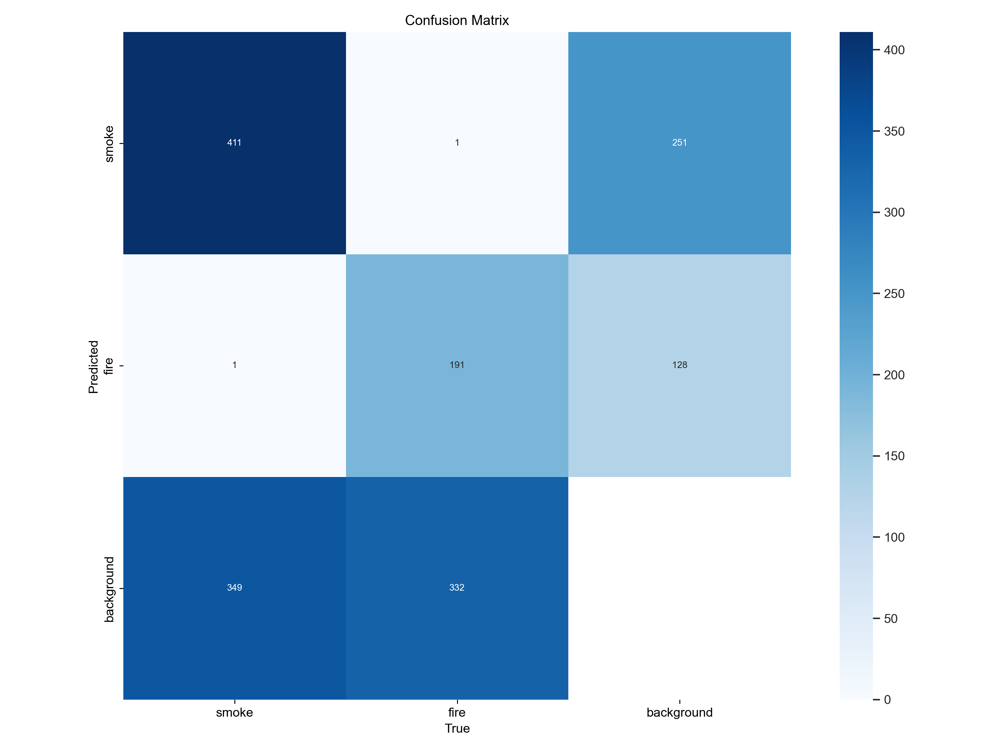

In [9]:
Image.open(f"runs/detect/train/confusion_matrix.png")

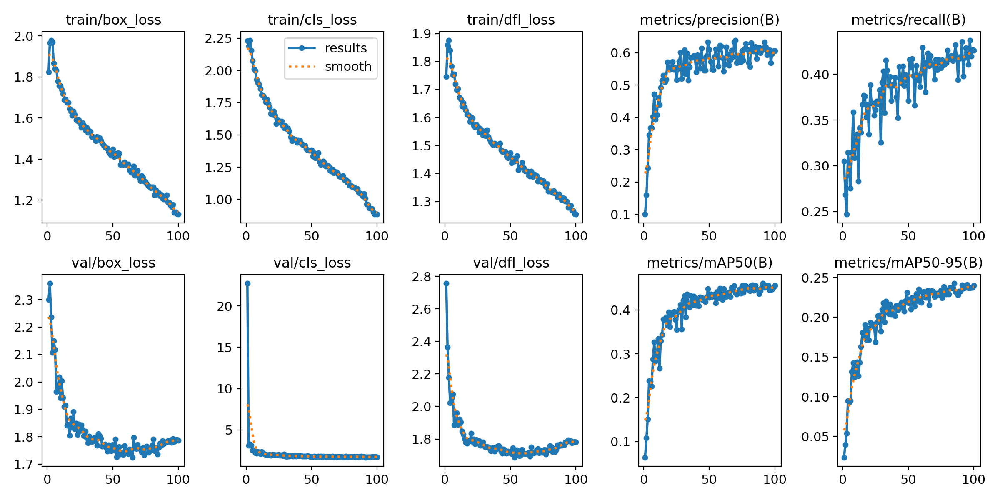

In [10]:
Image.open(f"runs/detect/train/results.png")

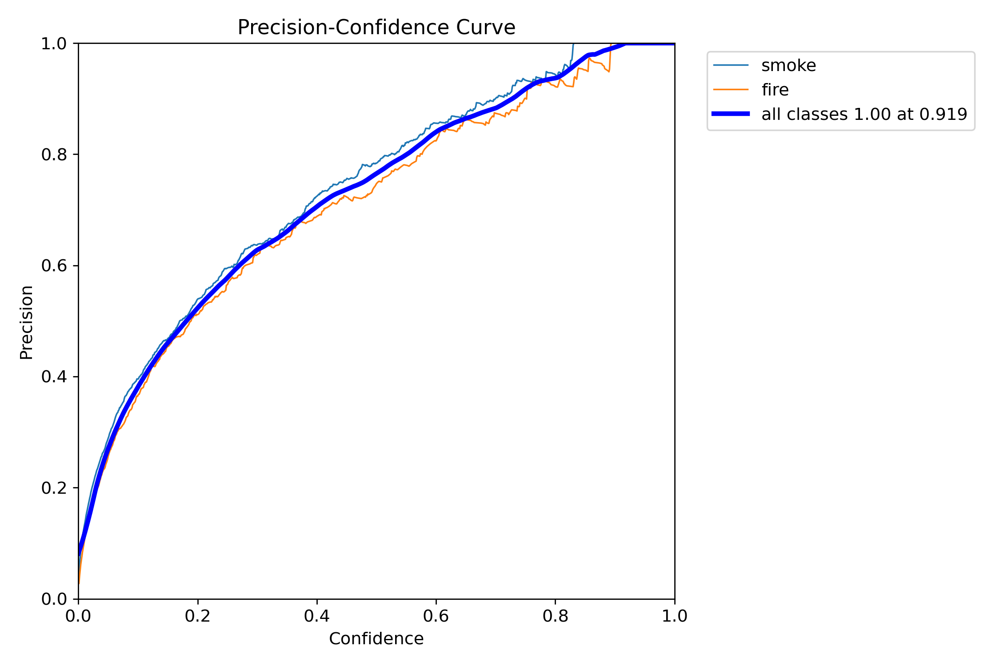

In [11]:
Image.open(f"runs/detect/train/P_curve.png")

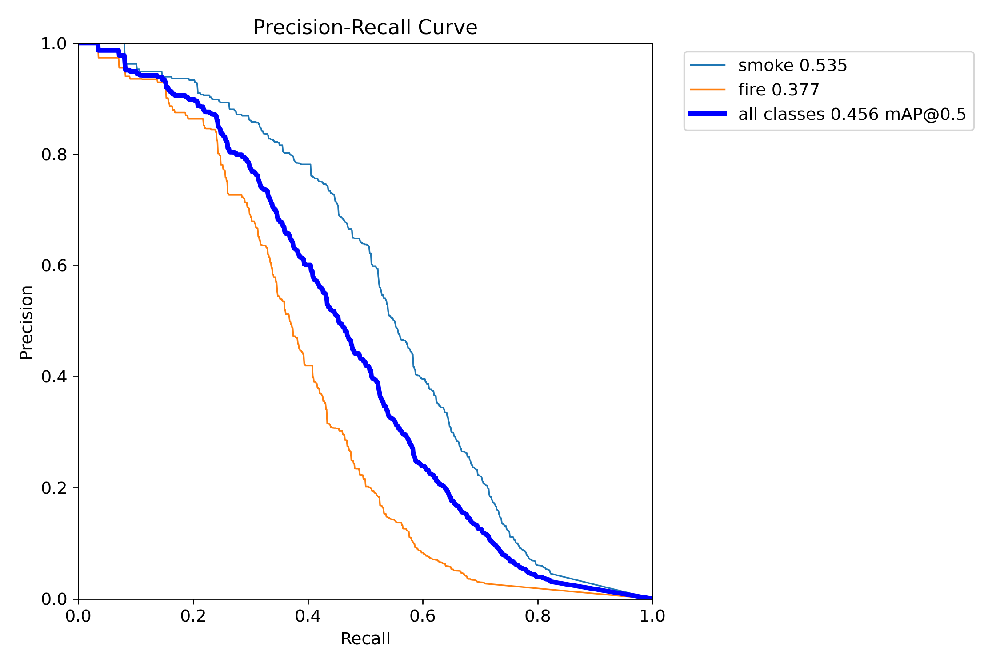

In [12]:
Image.open(f"runs/detect/train/PR_curve.png")

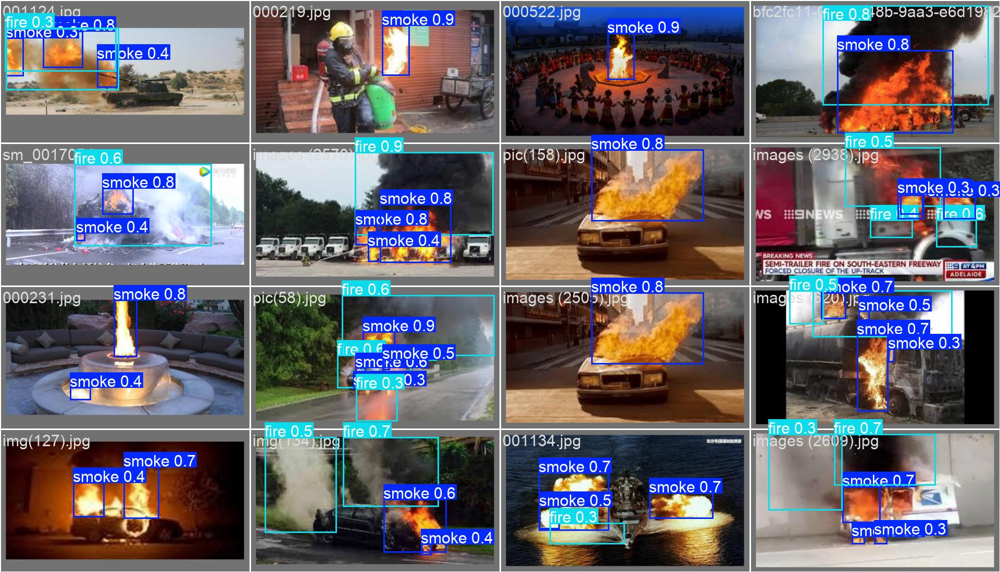

In [13]:
Image.open(f"runs/detect/train/val_batch0_pred.jpg")

<div style='background-color: #fff7f7; border: 2px solid '>
    <font size="+2" color="blue" ><b>✅6. Inference with Test Dataset✅</b></font>
</div>

In [14]:
inference_results = model(f"{root}/data/val/images", device = 0, verbose = False)

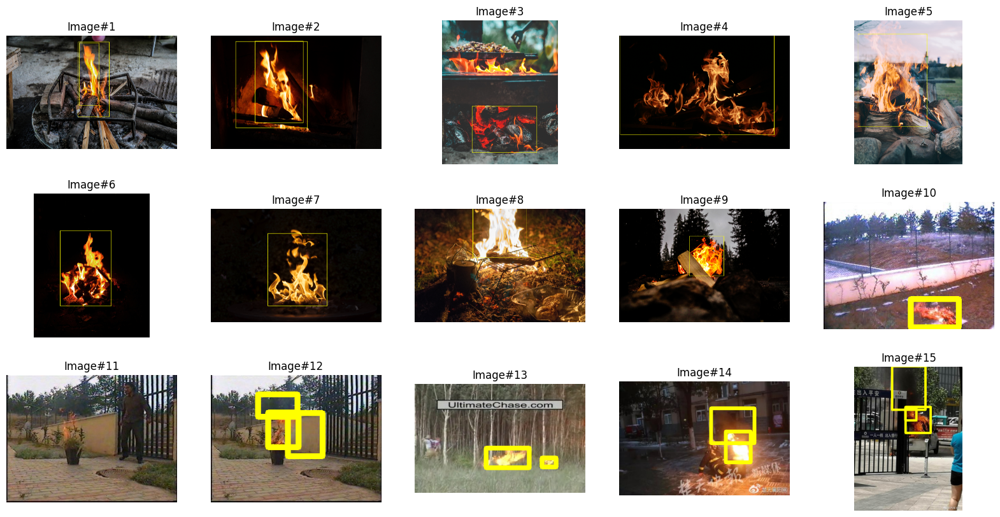

In [15]:
def inference_vis(res, n_ims, rows):
    cols = n_ims // rows
    plt.figure(figsize = (20, 10))
    for idx, r in enumerate(res):
        if idx == n_ims: break
        plt.subplot(rows, cols, idx + 1)
        or_im_rgb = np.array(Image.open(r.path).convert("RGB"))
        if idx == n_ims: break
        for i in r:
            for bbox in i.boxes:
                box = bbox.xyxy[0]
                x1, y1, x2, y2 = box
                coord1, coord2 = (int(x1), int(y1)), (int(x2), int(y2))
                cv2.rectangle(or_im_rgb, coord1, coord2, color=(255,255,0), thickness=10)
        plt.imshow(or_im_rgb)
        plt.title(f"Image#{idx + 1}")
        plt.axis("off")
inference_vis(res = inference_results, n_ims = 15, rows = 3)

In [16]:
results = model.val(data='updated_config.yml', device=0, conf=0.5, iou=0.5, save_json=True, save_conf=True)

Ultralytics 8.3.82  Python-3.10.6 torch-2.5.1+cu118 CUDA:0 (NVIDIA GeForce RTX 2060 SUPER, 8192MiB)


val: Scanning D:\t\dataset_fire_smoke\data\val\labels.cache... 308 images, 0 backgrounds, 0 corrupt: 100%|██████████| 308/308 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 39/39 [00:09<00:00,  4.26it/s]


                   all        308       1285      0.786       0.32       0.56      0.359
                 smoke        303        761      0.798       0.38      0.597      0.386
                  fire        250        524      0.773       0.26      0.523      0.332
Speed: 0.3ms preprocess, 7.1ms inference, 0.0ms loss, 0.9ms postprocess per image
Saving runs\detect\train2\predictions.json...
Results saved to runs\detect\train2
